In [145]:
import sys
import os
import time
import pandas as pd
import pickle
import obspy
import numpy as np
import matplotlib.pyplot as plt

# Importing the main code.
module_path = os.path.abspath(os.path.join('../src/ocloc'))
if module_path not in sys.path:
    sys.path.append(module_path)
from ocloc import ProcessingParameters, ClockDrift, suppress_stdout
import ocloc
import importlib
importlib.reload(ocloc)

<module 'ocloc' from '/Users/localadmin/Dropbox/GitHub/ocloc/src/ocloc/ocloc.py'>

In [86]:
# Parameters for locating the files where the correlation files and station 
# information is contained.
path2data_dir = "/Users/localadmin/Dropbox/GitHub/data"
# path2data_dir = "/Users/localadmin/Dropbox/GitHub/ocloc/tutorials/correlations_O20"
station_file = "/Users/localadmin/Dropbox/GitHub/ocloc/tutorials/station_info"
# station_file = "/Users/localadmin/Dropbox/GitHub/ocloc/tutorials/station_info_rebuttal"
reference_time = '2014-08-21T00:00:00.000000Z'

# csv file with additional attributes
csv_file = 'metadata/iceland_metadata_extended.csv'
params2 = ProcessingParameters(
                 freqmin = 0.2, # Low freq. for the bandpass filter
                 freqmax = 0.4, # High freq. for the bandpass filter 
                 ref_vel = 4500, # m/s
                 dist_trh = 2.5, # Minimum station separation in terms of wavelength
                 snr_trh = 30, # Signal-to-noise ratio threshold
                 noise_st = 240, # start of the noise window.
                 dt_err = 0.004, # Sampling interval needs to be multiple of this value.
                 resp_details = False)

cd = ocloc.ClockDrift(station_file, path2data_dir,
                      reference_time = '2014-08-21T00:00:00.000000Z',
                      list_of_processing_parameters=[params2])#, params3])

cd.add_attributes_from_csv(csv_file)

cd.calculate_aprioridt_4_allcorrelations()
cd.calculate_dt_ins()
cd.calculate_tapp_4_allcorrelations()
cd.build_matrices()
cd.solve_eq()

for i in range(3):
    cd.calculate_tapp_4_allcorrelations()
    cd.calculate_dt_ins()
    cd.remove_outiers(max_error=1.)
    cd.calculate_dt_ins()
    cd.build_matrices()
    cd.solve_eq()

No correlation file found for station:O26
No correlation file found for station:#STK
Calculating the apriori estimates for each stationpair
Calculating the t_app for each stationpair.
Calculating a and b for each station.
Calculating the t_app for each stationpair.
Calculating a and b for each station.
Calculating the t_app for each stationpair.
Calculating a and b for each station.
Calculating the t_app for each stationpair.
Calculating a and b for each station.


In [153]:
def calculate_time_diff_in_days(start_time, end_time):
    """
    Calculate the number of days between the given time and the reference time.

    Parameters:
        time (obspy.UTCDateTime): The input time.

    Returns:
        float: The number of days between the input time and the reference time.
    """
    start_time = obspy.UTCDateTime(start_time)
    end_time = obspy.UTCDateTime(end_time)
    return (end_time - start_time) / 86400.

def calculate_drift_from_skew(skew_s, start_time, end_time):
    """
    Calculate the a matrix from the skew.

    Parameters:
        skew_s (float): The skew. Time difference between the clock and the GNSS
          time in seconds.
        start_time (obspy.UTCDateTime): The start time of the
          recording. It should match the time when the clock was synchronized
          with the GNSS time.
        end_time (obspy.UTCDateTime): The end time of the recording.
            It should match the time when the clock compared with the
            GNSS time and the skew is measured.
        

    Returns:
        a (float): The drift_rate in seconds per day.
    """
    # Calculate the number of days from the reference time.
    dt = calculate_time_diff_in_days(start_time, end_time)
    a = skew_s / dt
    return a

def calculate_skew_on_date(date, start_time, end_time, skew_s):
    """
    Calculate the skew at the reference time.

    Parameters:
        skew_on_date (obspy.UTCDateTime): The reference time.
        start_time (obspy.UTCDateTime): The start time of the
          recording. It should match the time when the clock was synchronized
          with the GNSS time.
        end_time (obspy.UTCDateTime): The end time of the recording.
            It should match the time when the clock compared with the
            GNSS time and the skew is measured.
        skew_s (float): The skew. Time difference between the clock and the GNSS
          time in seconds.
    
    Returns:
        skew_on_date (float): The skew at the reference time.
    """
    a = calculate_drift_from_skew(skew_s, start_time, end_time)
    dt = calculate_time_diff_in_days(start_time, date)
    skew_on_date = 0 - a * dt
    return skew_on_date

def calculate_skew_on_date_with_ocloc(cd, date, station_code):
    station = cd.get_station(station_code)
    a = station.a[-1]
    b = station.b[-1]
    dt = calculate_time_diff_in_days(cd.reference_time, date)
    skew_on_date = a * dt + b
    return skew_on_date
        
# Build a table comparing drift_rate with a values from each station
drift_rates = []
skews = []
for station in cd.stations:
    if not station.needs_correction:
        continue
    station.skew_s = station.skew_ms * 1e-6 -1
    drift_rates.append(calculate_drift_from_skew(
        station.skew_s, station.start_time_gps, station.end_time_recovery))
    skews.append(station.skew_s)

df = pd.DataFrame()
df['station'] = [s.code for s in cd.stations if s.needs_correction]
df['start time'] = [s.start_time_gps for s in cd.stations if s.needs_correction]
df['end time'] = [s.end_time_recovery for s in cd.stations if s.needs_correction]
df['drift_rate_from_skew[s/day]'] = [-1*d for d in drift_rates]
df['drift_rate_from_ocloc[s/day]'] = [s.a[-1] for s in cd.stations if s.needs_correction]
df['Difference'] = df['drift_rate_from_skew[s/day]'] - df['drift_rate_from_ocloc[s/day]']
# df['skew[s] measured'] = skews
df['skew[s] measured'] = [calculate_skew_on_date(s.end_time_recovery, s.start_time_gps, s.end_time_recovery, s.skew_s) for s in cd.stations if s.needs_correction]
df['skew[s] on end time - ocloc'] = [calculate_skew_on_date_with_ocloc(cd, s.end_time_recovery, s.code) for s in cd.stations if s.needs_correction]
df['skew[s] on start time - ocloc'] = [calculate_skew_on_date_with_ocloc(cd, s.start_time_gps, s.code) for s in cd.stations if s.needs_correction]

display(df)

,station,start time,end time,drift_rate_from_skew[s/day],drift_rate_from_ocloc[s/day],Difference,skew[s] measured,skew[s] on end time - ocloc,skew[s] on start time - ocloc
0,O01,2014-08-22T19:13:46,2015-08-26T21:47:41,-0.002772,-0.002013,-0.000759,-1.023125,-1.055899,-0.312893
1,O02,2014-08-22T19:03:35,2015-08-26T21:38:19,-0.002143,-0.002891,0.000748,-0.790906,-1.182942,-0.115932
2,O03,2014-08-22T20:23:08,2015-08-26T21:20,-0.000374,-0.001101,0.000727,-0.137906,-0.515270,-0.109016
3,O04,2014-08-22T19:52:43,2015-08-26T21:29:16,-0.002098,-0.002111,0.000013,-0.774437,-0.968726,-0.189580
4,O06,2014-08-21T19:53:29,2015-08-30T11:07:25,-0.000347,-0.000473,0.000126,-0.129468,-0.343849,-0.167178
5,O08,2014-08-19T12:26:05,2015-08-29T22:21:11,-0.000265,-0.000286,0.000020,-0.099625,-0.433947,-0.326684
6,O10,2014-08-20T17:18:42,2015-08-31T14:20:05,-0.002163,-0.003002,0.000838,-0.813093,-1.354066,-0.225838
7,O11,2014-08-20T18:40:48,2015-08-30T10:15:08,-0.001254,-0.001829,0.000575,-0.469656,-1.089599,-0.404515
8,O14,2014-08-20T22:51:43,2015-06-16T22:51:43,-0.000894,-0.000835,-0.000059,-0.268156,-0.462262,-0.211672
9,O15,2014-08-22T20:37:53,2015-08-30T19:30,-0.004475,-0.004014,-0.000461,-1.669093,-1.839114,-0.342056


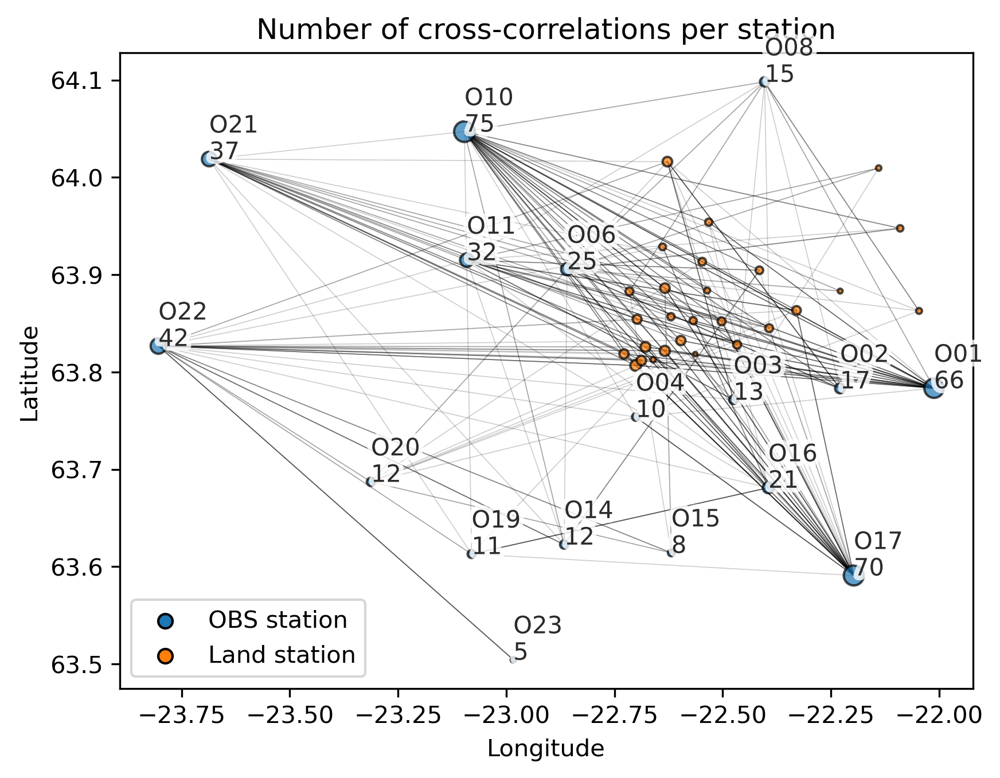

In [176]:
cd.plot_inventory_correlations()

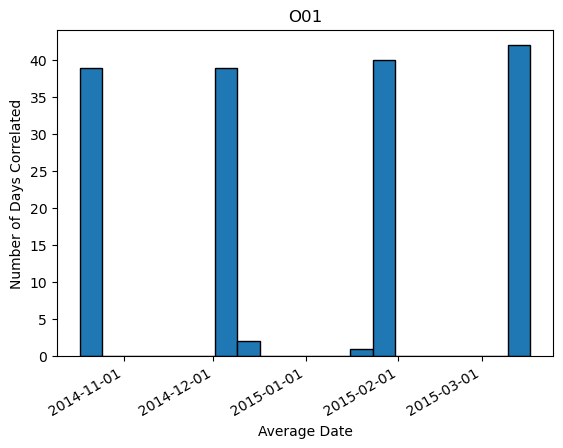

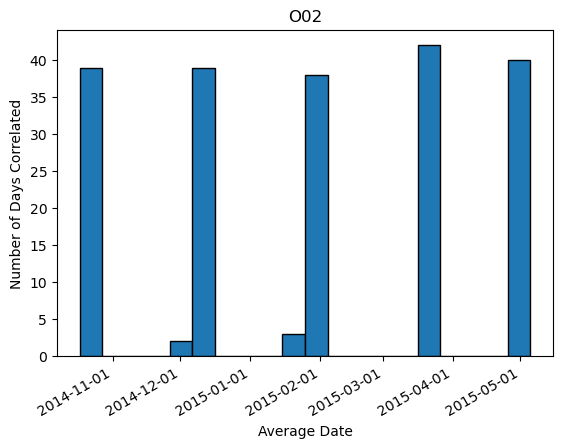

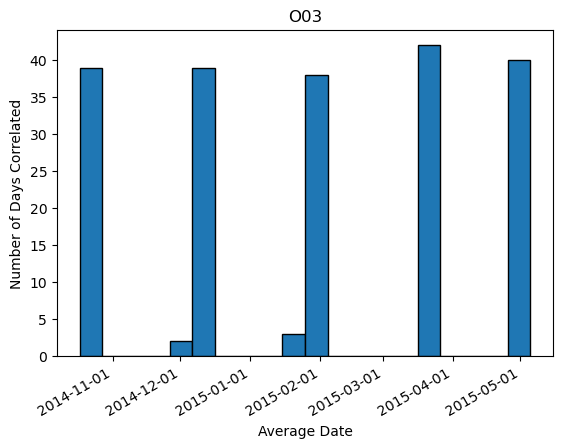

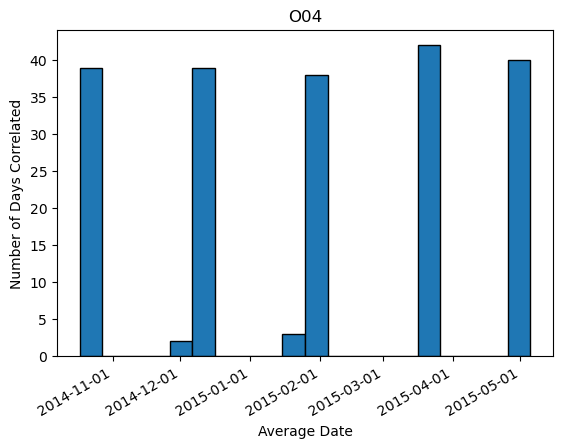

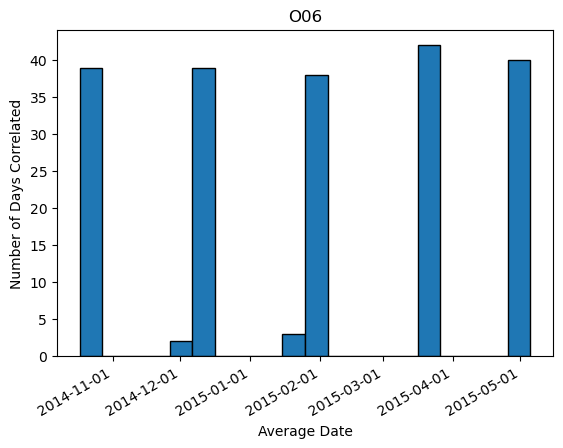

...

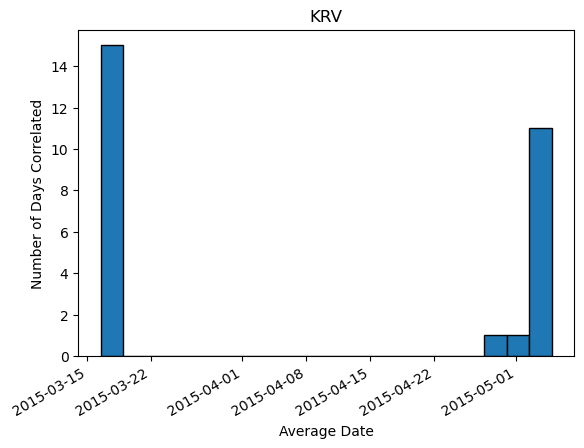

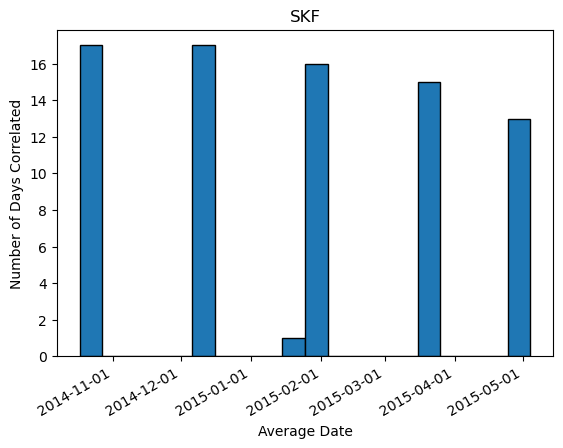

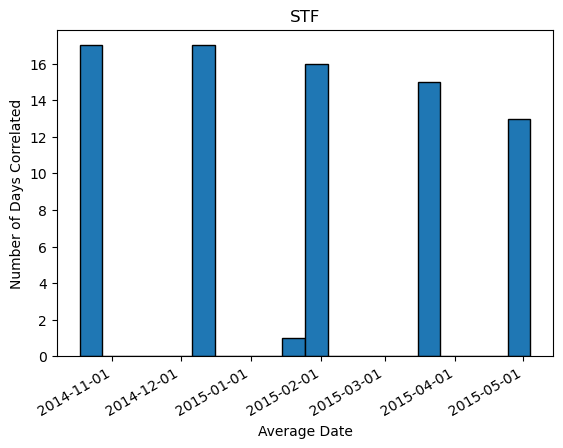

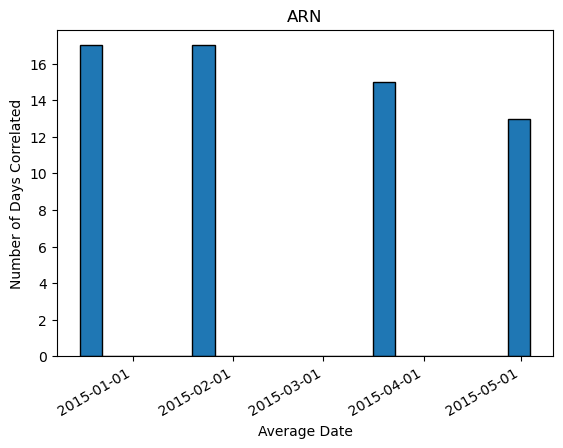

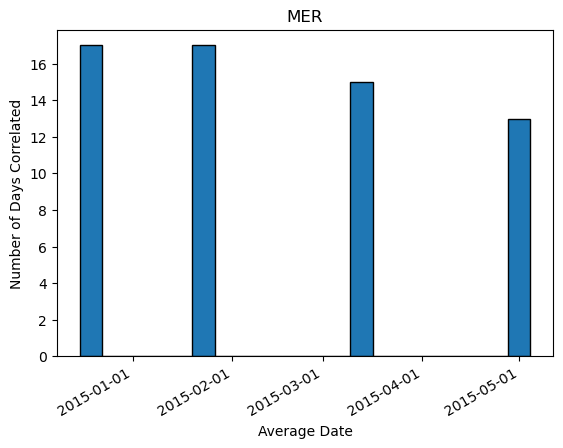

In [174]:
for station in cd.stations:
    # Histogram of number of days
    number_of_days = []
    dates = []
    correlations = cd.get_correlations_of_station(station.code)
    for correlation in correlations:
        number_of_days.append(correlation.number_days)
        dates.append(correlation.average_date.datetime)

    import matplotlib.pyplot as plt
    import matplotlib.dates as mdates
    from datetime import datetime

    # Assuming you already have the 'dates' and 'number_of_days' lists

    num_bins = 20

    plt.hist(dates, bins=num_bins, edgecolor='black')
    plt.xlabel('Average Date')
    plt.ylabel('Number of Days Correlated')
    plt.title(station.code)
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gcf().autofmt_xdate()

    plt.show()



In [169]:
c = cd.get_correlations_of_station("O20")
print(c[0].__dict__)

{'station1_code': 'ARN', 'station2_code': 'O20', 'average_date': UTCDateTime(2014, 12, 15, 13, 54, 34), 'number_days': 82.0, 'file_path': '/Users/localadmin/Dropbox/GitHub/data/ARN_O20_1418651674_082.sac', 'npts': 90000, 'sampling_rate': 25.0, 'length_of_file_s': 3599.96, 'delta': 0.03999999910593033, 'cpl_dist': 65463.54621760551, 't_app': [2.336, 2.336, nan, nan], 'apriori_dt1': nan, 'apriori_dt2': nan, 'dt_ins_station1': [0], 'dt_ins_station2': [nan, -1.1195596332114075, -1.1195596332114075, -1.2803324863419363, -1.2803324863419363, -1.4484940999211584, -1.4484940999211584], 'processing_parameters': Processing Parameters Object:
Minimum frequency: 0.2
Maximum frequency: 0.4
Reference surface wave velocity: 4500.0
Minimum station separation in terms of wavelength: 2.5
Signal-to-noise ratio threshold: 30.0
Start of the noise window: 240, 't_N_lps': 116.57956018518519, 'snr_a': inf, 'snr_c': inf, 'acausal_until_index': '        44525', 'acausal_from_index': '        44275', 'causal_fro

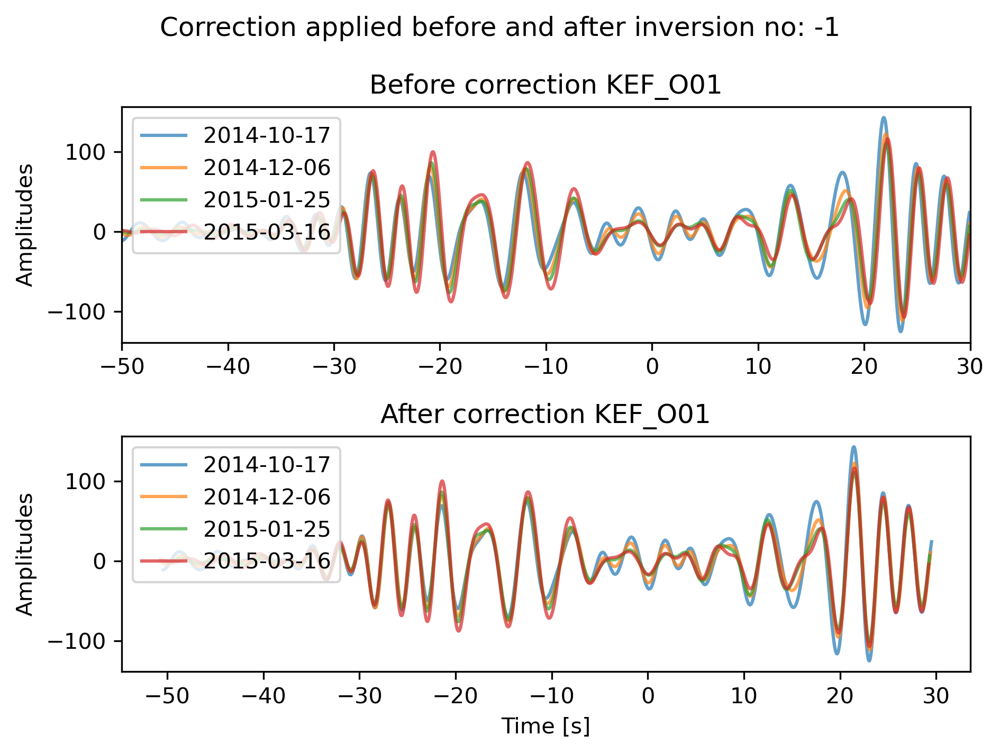

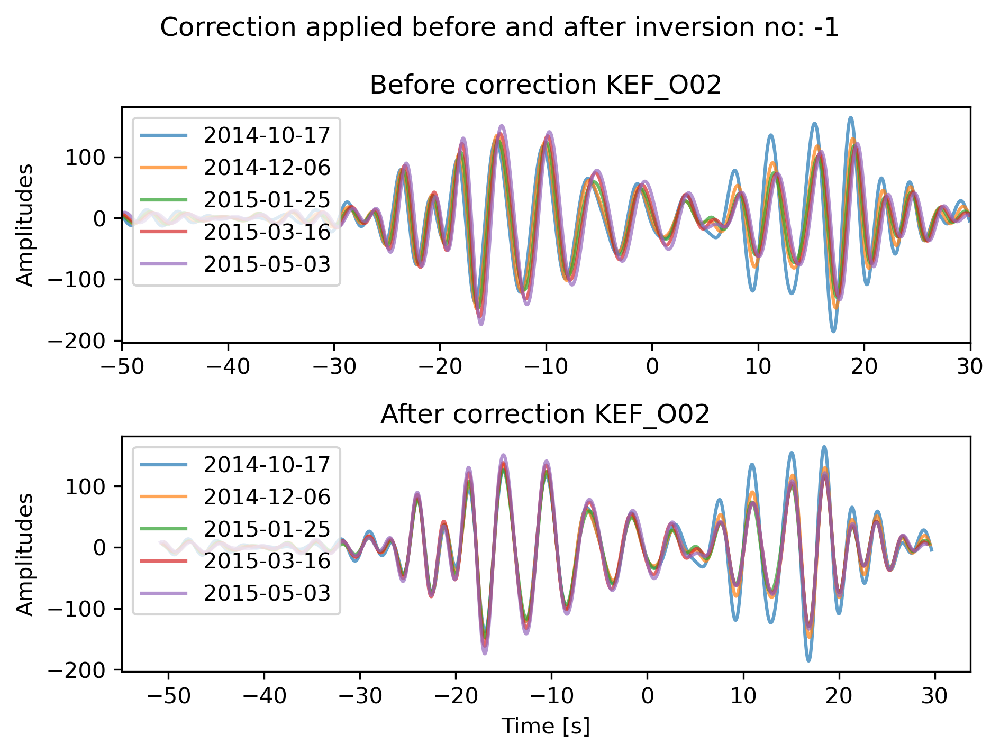

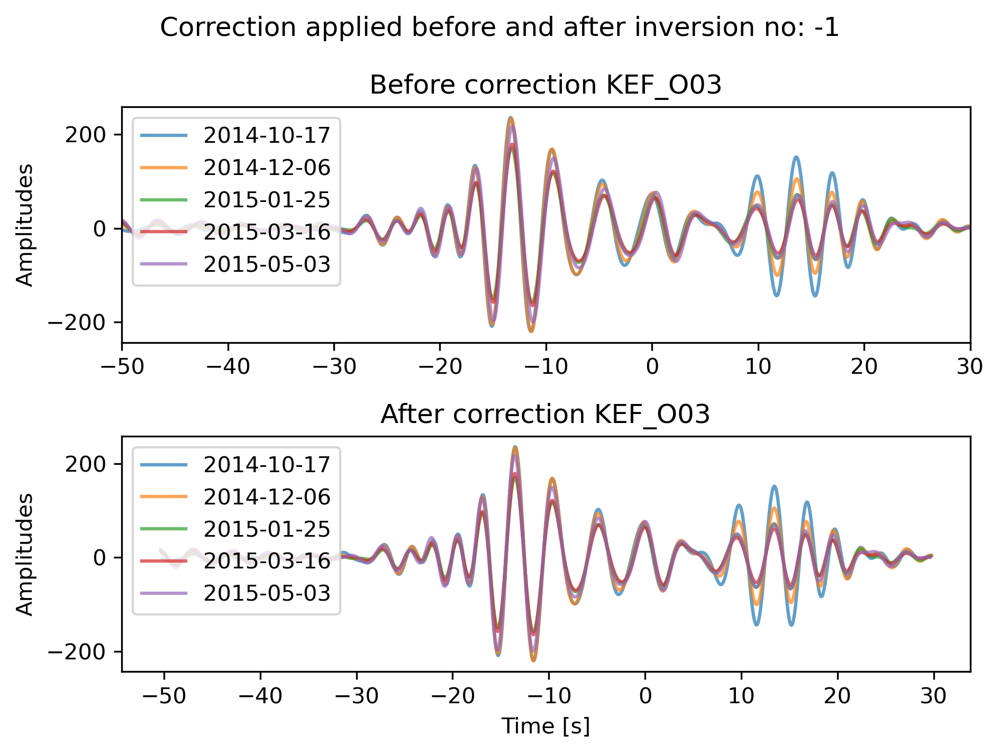

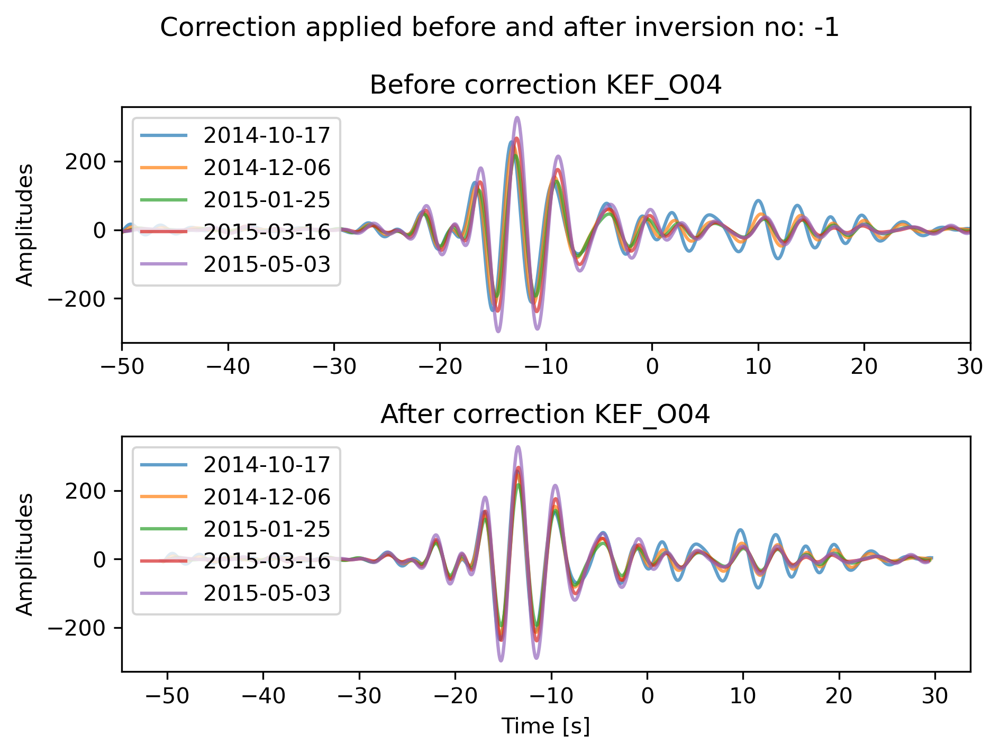

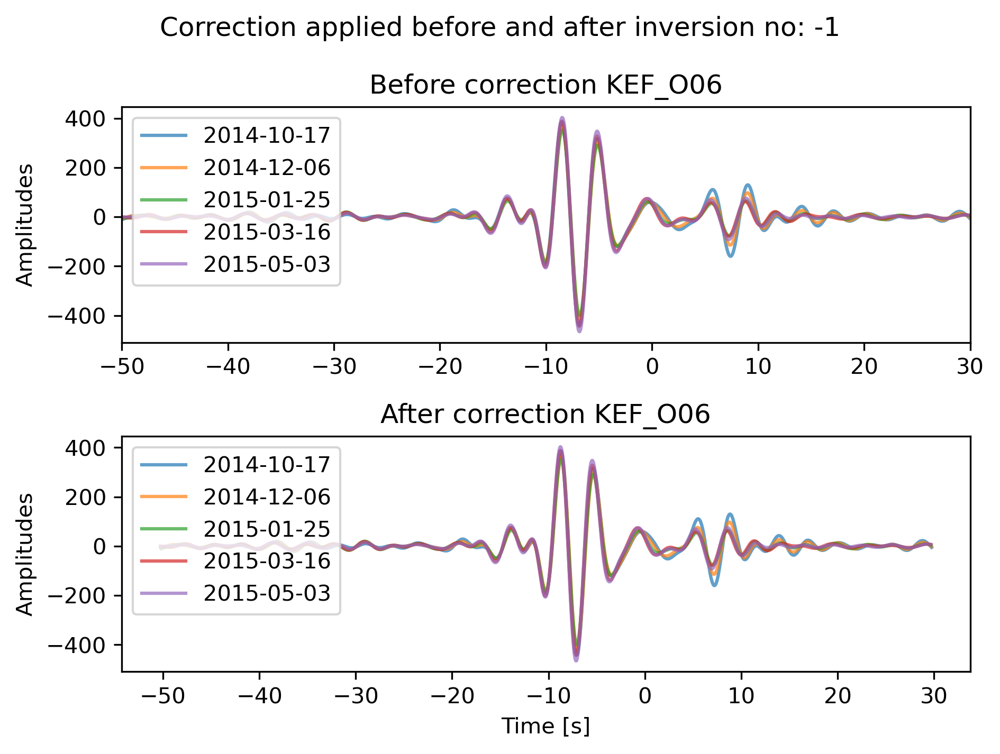

...

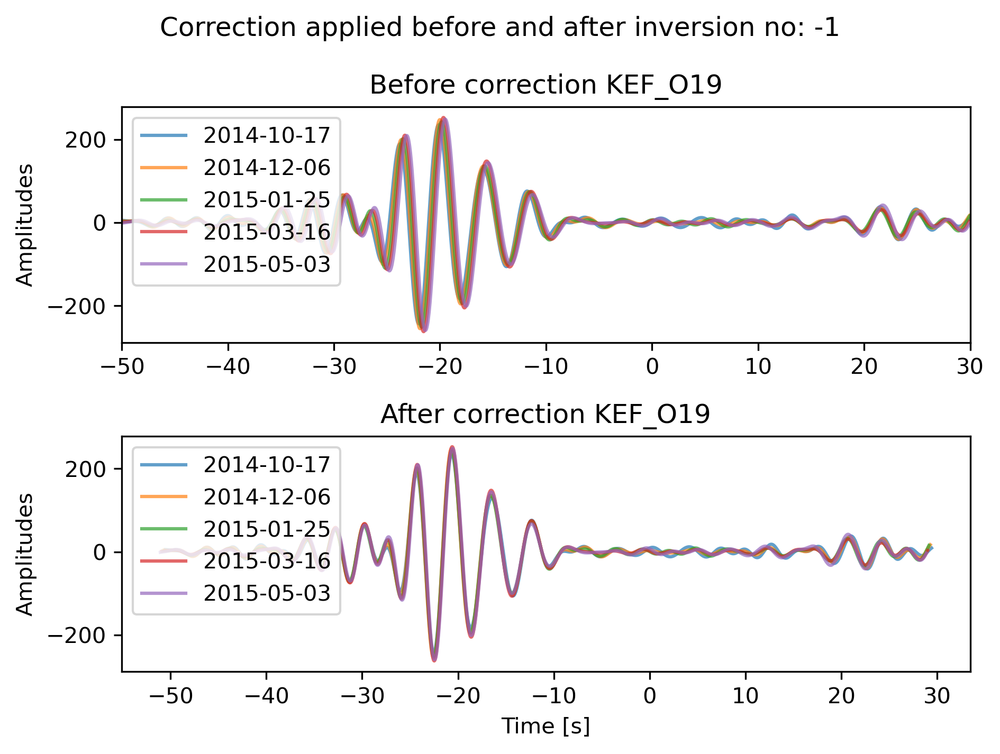

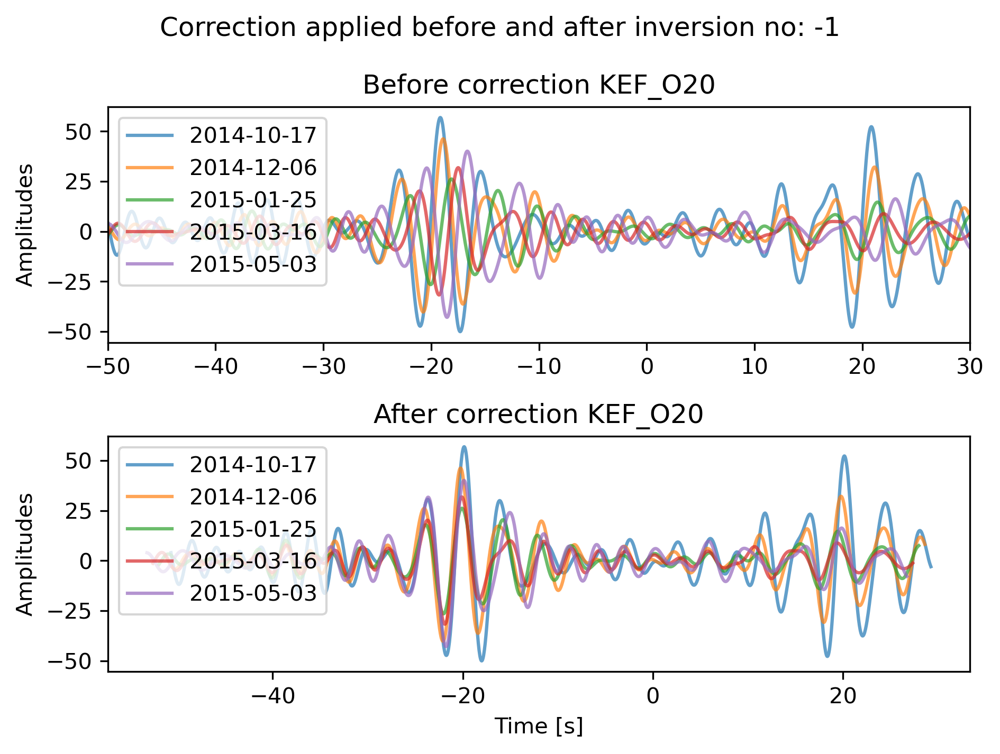

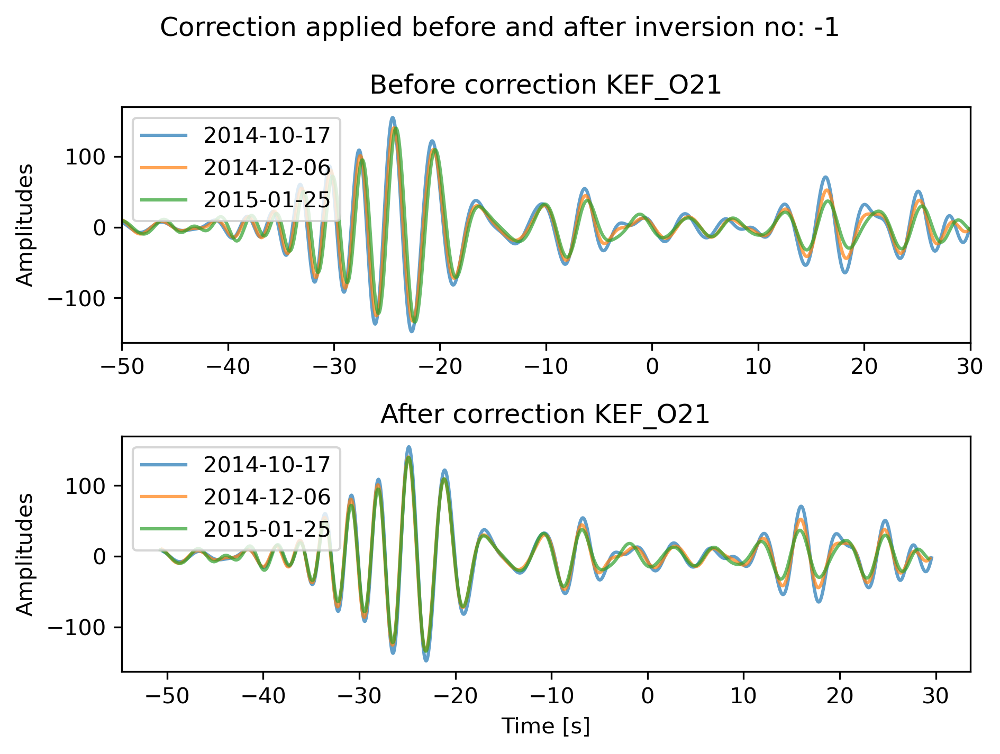

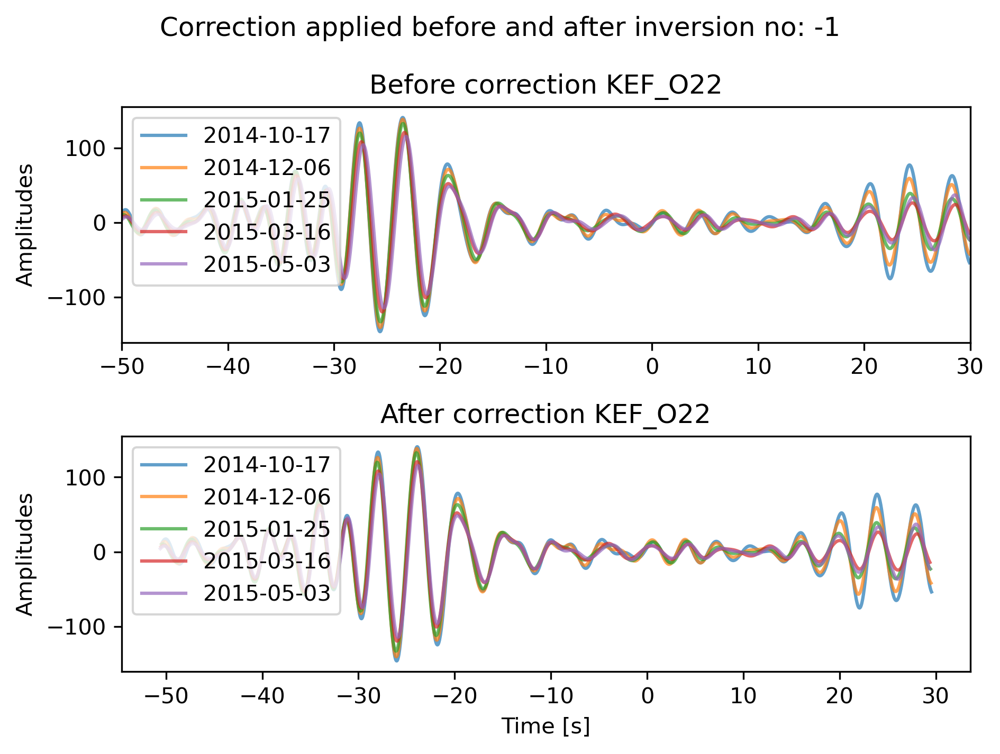

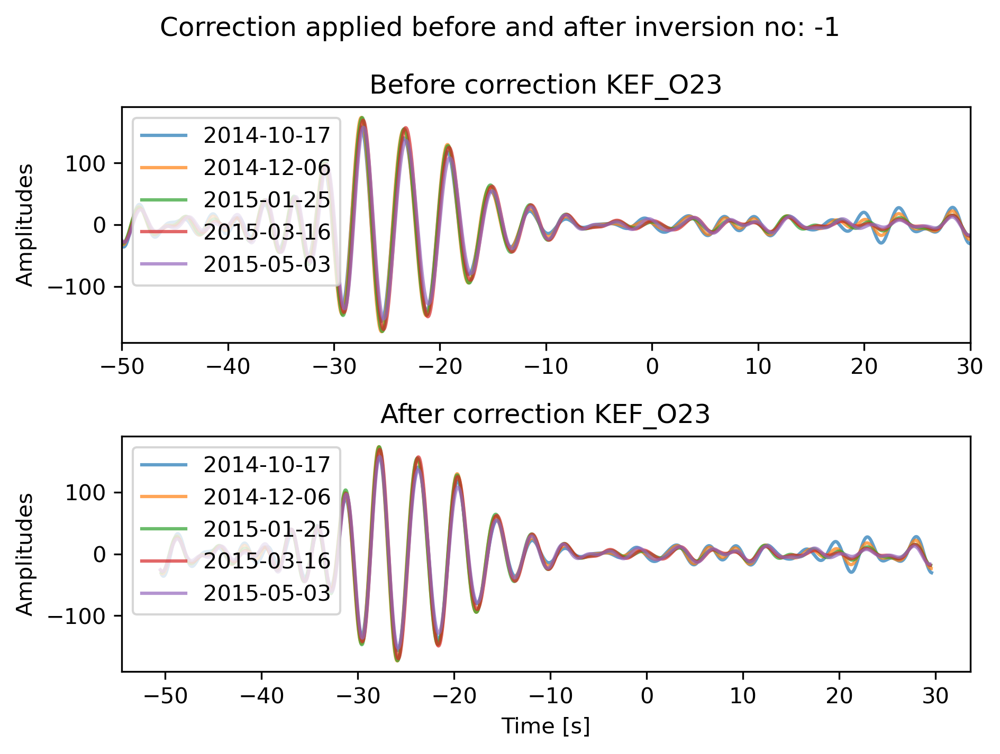

IndexError: list index out of range

In [161]:
for station in cd.stations:
    cd.plot_correlation_beforeNafter_correction(station.code, "KEF")

In [157]:
for i, station in enumerate(cd.stations):
    print(i, station.code)

0 O01
1 O02
2 O03
3 O04
4 O06
5 O08
6 O10
7 O11
8 O14
9 O15
10 O16
11 O17
12 O19
13 O20
14 O21
15 O22
16 O23
17 BER
18 EIN
19 GEV
20 HAH
21 HAS
22 HOS
23 KEF
24 KUG
25 LFE
26 ONG
27 PAT
28 PRE
29 RAH
30 RAR
31 RET
32 SDV
33 SKG
34 SKH
35 STA
36 SUH
37 NEW
38 HOP
39 KHR
40 KRV
41 SKF
42 STF
43 ARN
44 MER


In [100]:
from datetime import datetime
import pandas as pd


def plot_station_skew(station, cd=None, remove_leap_seconds=True):
    """
    Create a skew plot for a given station.

    Parameters:
    station (Station): The Station object for which to plot the skew.
    cd (Cd, optional): The Cd object containing the reference time.

    Returns:
    None
    """
    import plotly.graph_objects as go
    from datetime import datetime
    # Create an empty figure
    fig = go.Figure()

    # Add each curve to the figure
    for start_attr, end_attr in [('gps_sync_time', 'stop_recording'), 
                                 ('gps_sync_time', 'end_time_recovery'),
                                 ('start_time_gps', 'stop_recording'), 
                                 ('start_time_gps', 'end_time_recovery')]:
        # Start time, end time, and skew
        start_time = getattr(station, start_attr)
        end_time = getattr(station, end_attr)
        skew = station.skew_ms
        if remove_leap_seconds:
            skew -= 1e6
        duration = (pd.to_datetime(end_time) - pd.to_datetime(start_time)).total_seconds() / 86400

        # Calculate the drift rate and format to two decimal places
        drift_rate = f"{skew/duration:.2f}"
        
        skew = skew * 1e-6 # convert to seconds
        # Add the line to the figure
        fig.add_trace(
            go.Scatter(
            x=[start_time, end_time], y=[0, skew], 
            mode='lines', 
            name=f'{start_attr}<br>{end_attr}<br>Drift rate: {drift_rate} [microsec./day]'))
        
        # Plot the estimated drift_rates
        a = station.a[-1]
        b = station.b[-1]
        start_time_diff_to_reference = (
            cd.reference_time.datetime 
            - pd.to_datetime(start_time)).total_seconds() / 86400
        end_time_diff_to_reference = (
            cd.reference_time.datetime 
            - pd.to_datetime(end_time)).total_seconds() / 86400
        skew_estimated_start = a * (start_time_diff_to_reference) + b
        skew_estimated_end = a * (end_time_diff_to_reference) + b
        # Add the line to the figure
        fig.add_trace(
            go.Scatter(
            x=[start_time, end_time],
            y=[skew_estimated_start, skew_estimated_end], 
            mode='lines', 
            name=f'estimate by ocloc<br>Drift rate: {drift_rate} [microsec./day]'))

    if cd is not None:
        # Add vertical line at cd.reference_time
        fig.add_vline(x=cd.reference_time.datetime, line_width=3, 
                      line_dash="dash", line_color="green",
                      name='CD Reference Time')
        # Add "dummy" trace for the legend
        fig.add_trace(
            go.Scatter(
            x=[None], y=[None], mode='lines', 
            line=dict(color='green', dash='dash'), 
            name='cd.reference_time'))

    # Set the layout of the figure
    fig.update_layout(
        title=f'Skew over Time for Station {station.code}',
        xaxis_title='Time',
        yaxis_title='Skew [s]',
        legend_title='Start/End Times',
    )

    # Show the figure
    fig.show()

def calculate_drift(station, start_time='start_time_gps',
                    end_time='end_time_recovery', drift_on_date=None):
    """
    Calculate the drift rate for a station.

    This function calculates the drift rate for a station, based on the specified start and end times.
    Optionally, it can also calculate the exact drift value at a specified date.

    Parameters:
    station (Station): The Station object for which to calculate the drift rate.
    start_time (str): The attribute name of the start time ('start_time_gps' or 'gps_sync_time').
    end_time (str): The attribute name of the end time ('stop_recording' or 'end_time_recovery').
    drift_on_date (str, optional): Date at which to estimate the exact drift value. Must be in 'YYYY-MM-DD' format.

    Returns:
    float: The drift rate in skew microseconds per day.
    float, optional: The exact drift value at drift_on_date, if drift_on_date was specified.
    """
    try:
        # Get the start time, end time, and skew
        start = getattr(station, start_time)
        end = getattr(station, end_time)
        skew = station.skew_ms

        # Calculate the duration in days
        duration = (pd.to_datetime(end) - pd.to_datetime(start)).total_seconds() / 86400
        
        # Calculate the drift rate
        drift_rate = skew / duration

        # If a date is given to calculate the exact drift value
        if drift_on_date is not None:
            # Calculate the number of days from start to the given date
            days_from_start = (pd.to_datetime(drift_on_date) - pd.to_datetime(start)).total_seconds() / 86400

            # Calculate the exact drift value at the given date
            drift_at_date = drift_rate * days_from_start

            return drift_rate, drift_at_date

        return drift_rate

    except AttributeError:
        print(f'Error: Station object does not have one of the specified attributes: {start_time}, {end_time}, skew_ms.')
    except ValueError:
        print('Error: One of the dates is not properly formatted.')
    except TypeError:
        print('Error: One of the attributes is not a date or skew_ms is not a number.')
    except ZeroDivisionError:
        print('Error: The start and end times are the same, resulting in a division by zero error.')
    except Exception as e:
        print(f'An unexpected error occurred: {e}')

# Example usage:

plot_station_skew(cd.stations[9], cd=cd)
# calculate_drift(cd.stations[0])


In [88]:
start_time

Timestamp('2014-08-22 19:13:46+0000', tz='UTC')

In [3]:
def add_start_end_times_to_stations(cd, filename):
    # Read the csv file
    df = pd.read_csv(filename)

    # Iterate over each row of the DataFrame
    for idx, row in df.iterrows():
        # Find the station with the same sensor code
        try:
            station = cd.get_station(row['sensor_code'])
        except:
            print(f"Station {row['sensor_code']} not found")
            continue

        if station is not None:
            # List of all time-related fields
            time_fields = [
                'gps_sync_time',
                'start_time_gps',
                'st_date',
                'rt_date',
                'deployment_time',
                'end_time_recovery',
                'stop_recording',
                'skew'
            ]

            # Iterate over all time-related fields
            for time_field in time_fields:
                if row[time_field] is not np.nan:
                    try:
                        utc_date_time = obspy.UTCDateTime(row[time_field])
                        setattr(station, time_field, utc_date_time)
                        # print(f"Set {time_field} for Station {row['sensor_code']} to {utc_date_time}")
                    except ValueError:
                        print(f"Could not convert {time_field} for Station {row['sensor_code']}")

            # Add skew value if it's not NaN
            if row['skew'] is not np.nan:
                station.skew_value = row['skew']


add_start_end_times_to_stations(
    cd,
    'metadata/iceland_metadata_extended.csv')

Now we estimate the drift based on the skew values provided

O01 -0.002771893554997854 0.004992809101737223
2014-08-22T19:13:46.000000Z 2015-08-26T21:47:41.000000Z
Skew value 2023125


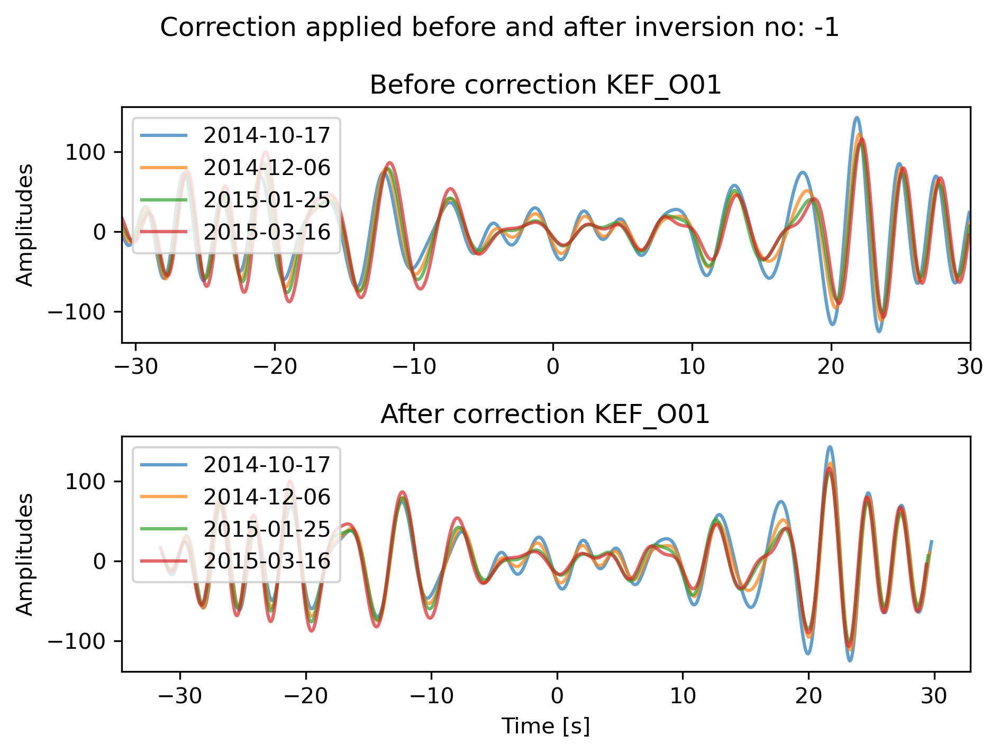

In [25]:
for station in cd.stations:
    if station.needs_correction:
        if station.skew_value is not None:
            if station.skew_value != 0:
                leap_second = 1
            else:
                leap_second = 0
            skew_value = station.skew_value/1e6 - leap_second
            time_difference_in_days = (station.end_time_recovery-station.start_time_gps)/86400
            drift = -skew_value/time_difference_in_days
            b = -drift*(station.start_time_gps-cd.reference_time)/86400
            station.a = [drift]
            station.b = [b]

for station in cd.stations:
    print(station.code, station.a[-1], station.b[-1])
    print(station.start_time_gps, station.end_time_recovery)
    print("Skew value", station.skew_value)
    cd.plot_correlation_beforeNafter_correction(station.code, "KEF",min_t=-31, max_t=30)
    break

O01 -0.0027405679406011163 -0.004936384563935062


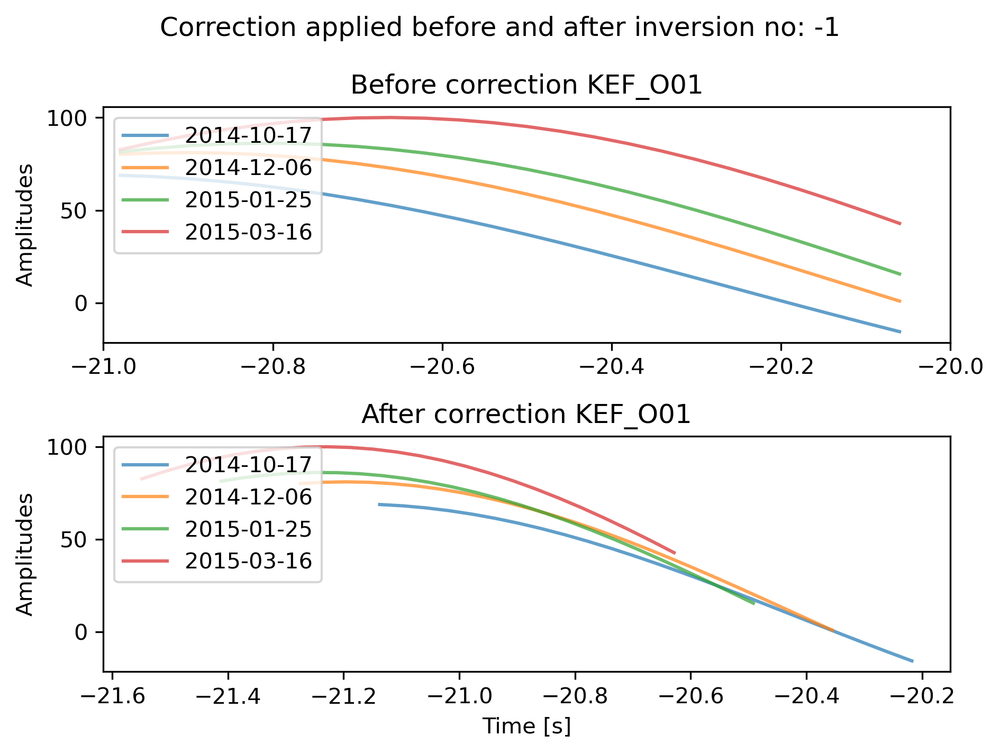

0.15758414740277263
0.29473891506564504
0.43165492977841435
0.5687398827417814


In [7]:
for station in cd.stations:
    t_N_lps = (station.start_time_gps - cd.reference_time) / 86400.0
    a = station.a[-1]
    b = station.b[-1]
    b = a * (t_N_lps) + b / 2
    print(station.code, station.a[-1], b)
    cd.plot_correlation_beforeNafter_correction(station.code, "KEF", min_t=-21, max_t=-20)
    correlations = cd.get_correlations_of_stationpair(station.code, "KEF")
    for correlation in correlations:
        average_date = correlation.average_date
        t_N_lps = (average_date - cd.reference_time) / 86400.0
        correction_sta1 = -(
            station.a[-1] * t_N_lps + station.b[-1]
        )
        print(correction_sta1)
    break
    
    